# saturi 프로젝트 EDA

In [1]:
# analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import tqdm

# other
import os

In [2]:
data_path = os.getenv('HOME') + '/aiffel/DATA'

['corpus_dec_8009.txt',
 'data_train_spm_4000_0317.pkl',
 'corpus_enc_8009.txt',
 'test_results_spm4000.csv',
 'test_v_final_0313.csv',
 'train_v_final_0317.csv',
 'corpus_dec_r0.txt',
 '.ipynb_checkpoints',
 'data_test_msp_4000_0320.pkl',
 'data_test_spm_4000_0317.pkl',
 'data_test_spm_4000.pkl',
 'data_train_spm_4000.pkl',
 'corpus_enc_r0.txt',
 'data_train_msp_4000_0320.pkl',
 'train_v_final_0313.csv',
 'test_results_msp4000.csv',
 'test_v_final_0317.csv',
 'corpus_dec_mecab_4009.txt']

## Load Data

In [170]:
df_train = pd.read_pickle(data_path + '/data_train_spm_4000_0317.pkl','gzip')
df_test = pd.read_pickle(data_path + '/data_test_spm_4000_0317.pkl','gzip')
df_test['weight'] = df_test['tok_cat'].apply(lambda x : 14 - x)
df_test = df_test.loc[df_test['tok_cat'] < 6].sample(n=250, weights = 'weight' ,random_state=6) # validation 시간이 너무 오래 걸림, 250개만 사용

In [171]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1340262 entries, 0 to 1340261
Data columns (total 8 columns):
 #   Column    Non-Null Count    Dtype 
---  ------    --------------    ----- 
 0   reg       1340262 non-null  object
 1   topic     1340262 non-null  object
 2   eng       1340262 non-null  object
 3   dial      1340262 non-null  object
 4   tok_len   1340262 non-null  int64 
 5   tok_cat   1340262 non-null  int64 
 6   toks_en   1340262 non-null  object
 7   toks_dec  1340262 non-null  object
dtypes: int64(2), object(6)
memory usage: 81.8+ MB


In [5]:
df_train.head(5)

,reg,topic,eng,dial,tok_len,tok_cat,toks_en,toks_dec
0,jd,역사,<jd> I've changed my mind a little bit.,생각이 쪼금씩 바뀌드라고,10,1,"[3981, 5, 3981, 3, 46, 854, 94, 810, 11, 79, 1...","[1, 796, 177, 2655, 2831, 107, 3353, 293, 2448..."
1,jd,가족,<jd> You know what? Foreigners still get used ...,웜마 알겄는가 애국인들이 그또 달 적응하고,17,1,"[3981, 5, 3981, 3, 14, 141, 106, 4005, 3981, 3...","[1, 733, 37, 2765, 1673, 130, 2675, 2477, 89, ..."
2,jd,건강,"<jd> All of a sudden, I think I've ripped off ...",아으 갑자기 에전에 맹장 뜯은 게잉 생각난디야.,22,1,"[3981, 5, 3981, 3, 48, 56, 11, 796, 3, 3981, 3...","[1, 11, 2488, 1667, 280, 763, 856, 2542, 2448,..."
3,jd,스타일,<jd> I have a lot of ideas about getting older...,보먼은 좀 품위 있게 나이 들어가야 되겠단 싱각을 참 마이 해요잉.,18,1,"[3981, 5, 3981, 3, 104, 11, 155, 56, 2402, 67,...","[1, 1545, 44, 2448, 2911, 2736, 15, 2461, 361,..."
4,jd,먹거리,"<jd> It's a little bit of a tastey, but still...",약깐 좀 약깐 맛이가 쪼까 머시기 카긴 한디 그또,18,1,"[3981, 5, 3981, 3, 3983, 3, 3988, 11, 79, 138,...","[1, 155, 44, 155, 239, 141, 897, 1053, 2463, 8..."


In [6]:
df_train.describe()

,tok_len,tok_cat
count,1.340262e+06,1.340262e+06
mean,3.743432e+01,1.971635e+00
std,4.656963e+01,2.049738e+00
min,1.000000e+00,1.000000e+00
25%,1.200000e+01,1.000000e+00
50%,1.900000e+01,1.000000e+00
75%,3.700000e+01,2.000000e+00
max,3.960000e+02,1.300000e+01


In [172]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 250 entries, 1362 to 893
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   reg       250 non-null    object
 1   topic     250 non-null    object
 2   eng       250 non-null    object
 3   dial      250 non-null    object
 4   tok_len   250 non-null    int64 
 5   tok_cat   250 non-null    int64 
 6   toks_en   250 non-null    object
 7   toks_dec  250 non-null    object
 8   weight    250 non-null    int64 
dtypes: int64(3), object(6)
memory usage: 19.5+ KB


In [173]:
df_test.head(5)

,reg,topic,eng,dial,tok_len,tok_cat,toks_en,toks_dec,weight
1362,kw,문학,<kw> Maybe they're just left out somewhere in ...,잘뭇허먼 컴 어인가에 거냥 방치돼서요.,15,1,"[3981, 8, 3981, 3, 65, 634, 181, 3, 17, 132, 7...","[1, 75, 3372, 2508, 2613, 1646, 16, 531, 2466,...",13
503,jj,자동차/오토바이,"<jj> Oh, I was in a terrible situation.",아게 나야말러레 억울한 상황이연,12,1,"[3981, 4, 3981, 3, 3989, 3, 3981, 3, 86, 64, 1...","[1, 286, 18, 2492, 2509, 355, 1435, 2547, 2489...",13
1269,kw,문학,<kw> So I'm going to Asacusa somewhere. I thin...,그러니까 어디가더라 아사쿠사에 갈 거예요. 집이는 아쭈 존 친구라고 생각해요. ...,75,4,"[3981, 8, 3981, 3, 3984, 3981, 3, 3995, 153, 3...","[1, 1707, 585, 2450, 541, 11, 2474, 3006, 2474...",10
73,jd,쇼핑,<jd> I don't know why we're so angry when we'r...,울 왜케 쇼핑하시로 분노하는 건지 모르겄는디,18,1,"[3981, 5, 3981, 3, 84, 3, 3983, 141, 200, 76, ...","[1, 72, 147, 2522, 1932, 2459, 986, 219, 2605,...",13
183,jd,먹거리,<jd> Itas going to burst out so how did you ea...,배불러 터지겠는디 그래가꼬 뭐~ 어뜨케 해가꼬 맨 먹었지.,16,1,"[3981, 5, 3981, 3, 3983, 67, 153, 30, 3317, 17...","[1, 209, 2629, 2516, 1129, 2456, 2589, 55, 723...",13


In [174]:
# check duplicates
print('train duplicated count :' ,df_train.duplicated(subset='dial').sum())
print('test duplicated count :' ,df_test.duplicated(subset='dial').sum())

train duplicated count : 0
test duplicated count : 0


In [175]:
# check for any overlaps in train and test
tr_dial = df_train.dial.values
ts_dial = df_test.dial.values
temp_ = np.concatenate([tr_dial, ts_dial], axis=0)
temp_ = print('overlap count : ',pd.DataFrame(temp_).duplicated().sum())

overlap count :  0


### reg별 데이터 분포

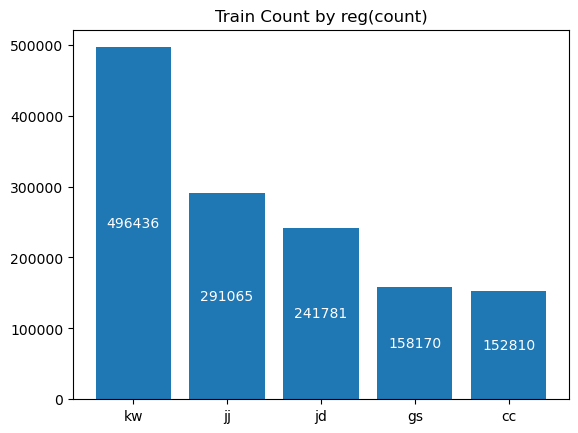

In [11]:
# count per region
data = df_train.reg.value_counts()
# data_ts = df_test.reg.value_counts(normalize=True).multiply(100).round(2)

fig, ax = plt.subplots()
p = ax.bar(data.index, data)
ax.bar_label(p, label_type='center', color='white')
plt.title("Train Count by reg(count)")
plt.show()

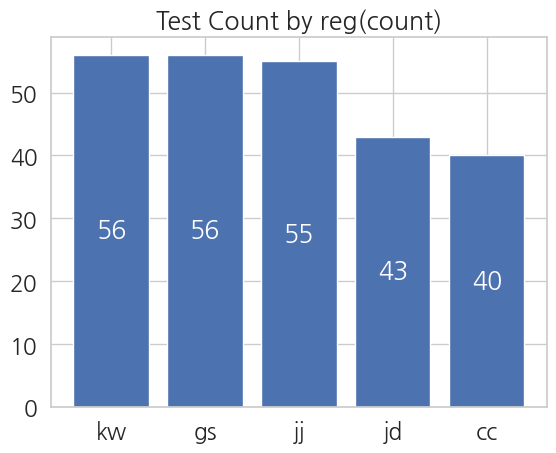

In [176]:
# count per region
data = df_test.reg.value_counts()
# data_ts = df_test.reg.value_counts(normalize=True).multiply(100).round(2)

fig, ax = plt.subplots()
p = ax.bar(data.index, data)
ax.bar_label(p, label_type='center', color='white')
plt.title("Test Count by reg(count)")
plt.show()

### topic별 분포

In [13]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

In [14]:
font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')
for i in font_list :
    fm.fontManager.addfont(i)
plt.rcParams['font.family'] = 'NanumBarunGothic'

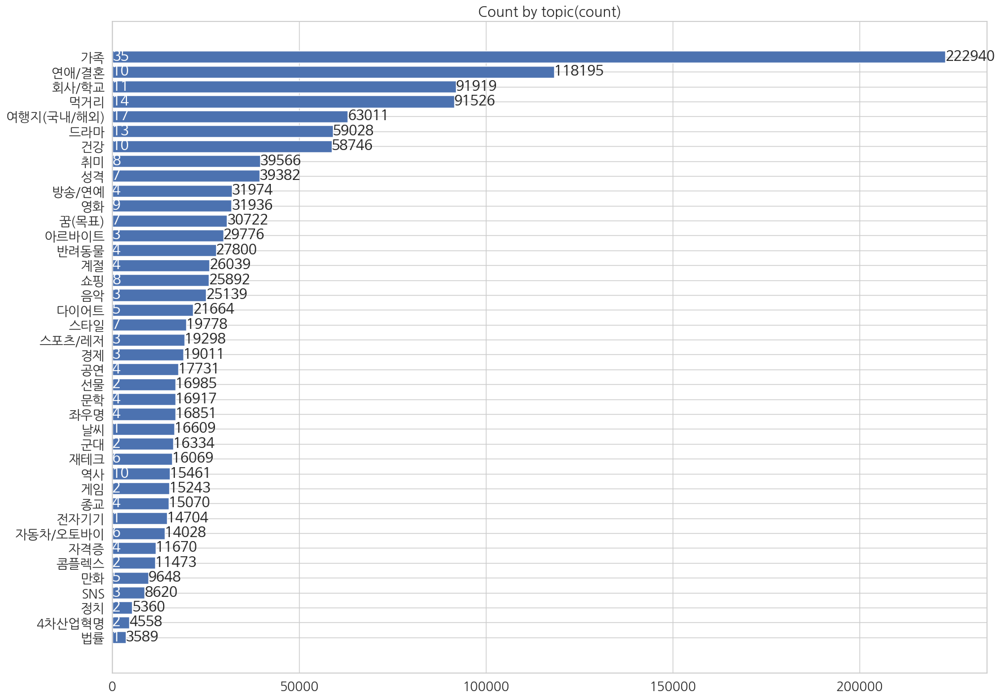

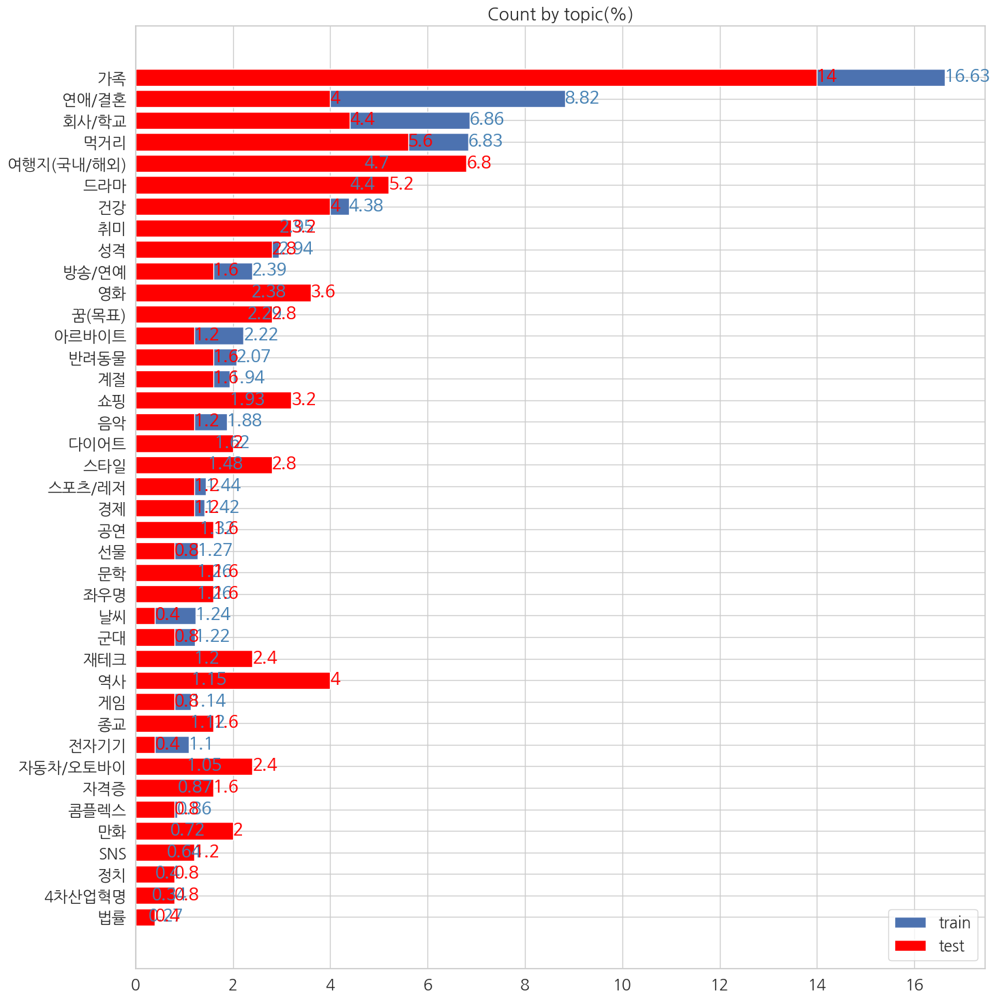

In [177]:
# check by topic
data = df_train.topic.value_counts().sort_values(ascending=True)
data_ts = df_test.topic.value_counts().sort_values(ascending=True)

fig, ax = plt.subplots(figsize=(20,15))
p = ax.barh(data.index, data, align='center')
t = ax.barh(data_ts.index, data_ts, align='center', color='red')
ax.bar_label(p, font='NanumBarunGothic')
ax.bar_label(t, color='white', font='NanumBarunGothic')
plt.title("Count by topic(count)")

data = df_train.topic.value_counts(normalize=True).multiply(100).round(2).sort_values(ascending=True)
data_ts = df_test.topic.value_counts(normalize=True).multiply(100).round(2).sort_values(ascending=True)

fig, ax = plt.subplots(figsize=(15,15))
p = ax.barh(data.index, data, align='center',label='train')
t = ax.barh(data_ts.index, data_ts, align='center', color='red', label='test')
ax.bar_label(p, color = 'steelblue',font='NanumBarunGothic')
ax.bar_label(t, color='red', font='NanumBarunGothic')
plt.legend()
plt.title("Count by topic(%)")

plt.tight_layout()
plt.show()

In [16]:
regs = df_train.reg.unique()

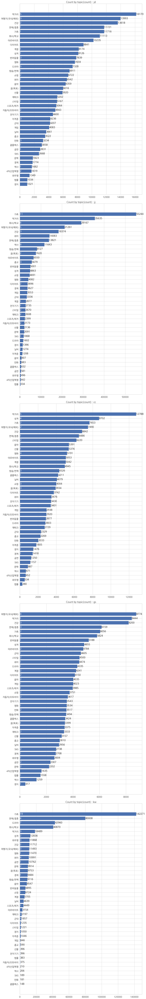

In [178]:
#by region
fig = plt.figure(figsize = (15,100))
for i,reg in enumerate(regs) :
    data = df_train.loc[df_train.reg == reg].topic.value_counts().sort_values(ascending=True)
    data_ts = df_test.loc[df_test.reg == reg].topic.value_counts().sort_values(ascending=True)
    ax = plt.subplot(5,1,i+1)
    p = ax.barh(data.index, data, align='center')
    t = ax.barh(data_ts.index, data_ts, align='center', color='red')
    ax.bar_label(p, font='NanumBarunGothic')
    ax.bar_label(t, color='white', font='NanumBarunGothic')
    plt.title(f"Count by topic(count) : {reg}")
plt.tight_layout()
plt.show()

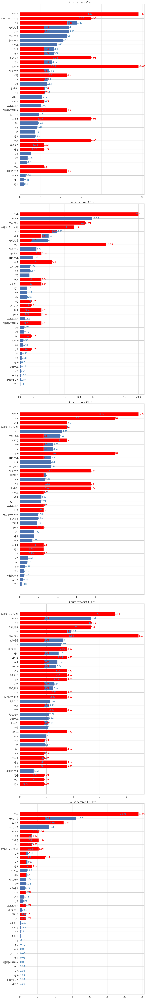

In [179]:
#by region %
fig = plt.figure(figsize = (15,100))
for i,reg in enumerate(regs) :
    data = df_train.loc[df_train.reg == reg].topic.value_counts(normalize=True).multiply(100).round(2).sort_values(ascending=True)
    data_ts = df_test.loc[df_test.reg == reg].topic.value_counts(normalize=True).multiply(100).round(2).sort_values(ascending=True)
    ax = plt.subplot(5,1,i+1)
    p = ax.barh(data.index, data, align='center')
    t = ax.barh(data_ts.index, data_ts, align='center', color='red')
    ax.bar_label(p, color='steelblue',font='NanumBarunGothic')
    ax.bar_label(t, color='red', font='NanumBarunGothic')
    plt.title(f"Count by topic(%) : {reg}")
plt.tight_layout()
plt.show()

### Char & Seq length 

In [189]:
# check max, min, ave range in data

def sen_len(corpus, kor=False) :
    max_len = 0
    min_len = 999
    cum_len = 0
    max_content = ''
    min_content = ''
    for i in corpus :
        if kor : 
            i = i[0]
        length = len(i)
        if length >= max_len : 
            max_len = length
            max_content = i
        if length <= min_len : 
            min_len = length
            min_content = i
        cum_len += length
    
    print(f'max_len : {max_len}')
    print('max_content :', max_content)
    print(f'min_len : {min_len}')
    print('min_content :', min_content)
    print(f'average_len : {round(cum_len/len(corpus),1)}')
    
    return max_len, min_len, cum_len

def plot_seq_dist(corpus,kor=False) :
    max_len, min_len , _ = sen_len(corpus,kor)
    seq_len_matrix = np.zeros((max_len+1), dtype=int)
    for i in corpus :
        if kor :
            i = i[0]
        length = len(i)
        seq_len_matrix[length] += 1
    
    fig,ax = plt.subplots()
    hist = ax.bar(range(len(seq_len_matrix)),seq_len_matrix, color='steelblue', width=1)
    plt.title('char_len_distribution')
    plt.show()

max_len : 650
max_content : 근꼬 아 뭐~ 예 정도느 뭐~ 괘안아 내 뭐~ 예 정도까지느 내나 인생 수업한 꺼꼬 경제 수업한 끼라꼬 생각해.  증말 아깝대이 이른 꺼 쓸데없이 이른 꺼를 랑 하꼬 고런 생각 드는데 그기 예산이 또 느무 남아도 알았느 된대이 가주꼬 뭐~  지느 주로 구매하느 기 지가 쫌 화장품에 관심이 많아가 화장품이라던지를 아이머 바디용품을 쫌 마이 사느 편인디  그서 쫌 뭐~ 우짤 수 없은 상황이꼬 당연히 약깐 복지를 국가들을 따라가야 된다느 건 맞지마  컴퓨터에 쫌 관심이 많았었는데 고런 식으로 가격대를 또 부대이 보믄은 아 요거를 또 굳이 사야 되노 이른 식으로 생각을 마이 카느 꺼 같애예 이기 또 가격이나 금액대가 있으먼은  지느 쪼깨 약깐 즈그 남편도 부에 관련된 책을 자꼬 읽어보래이 얘기를 카거든예 니 관념을 쫌 바까야 된대이.  보믄 머 니가 좋아하느 그륵이라든둥 이른 디느 쫌 욕심을 부려서 그렇지를.  약깐 쫌 안타까운 꺼 긋해 주 꺼머 고로 주던가 아니믄은 주질 말든가  쫌 학원비가 쫌 비싸께 들어가예 짐  그리 꼬 옷을 먼저 사가 입어보느 데라가 똔을 또 그마이 또 투자를 칼 수 있대이 생각하거든.  부모님한테 더 돌라꼬 카꼬 고런 경우가 쫌 자주 있더라고예.  쓸 데 쫌 씨꼬 여러 간대이 고로 경험도 마이 카꼬 이른 데 똔을 마이 쓰시꼬 
min_len : 2
min_content : 도 
average_len : 64.3


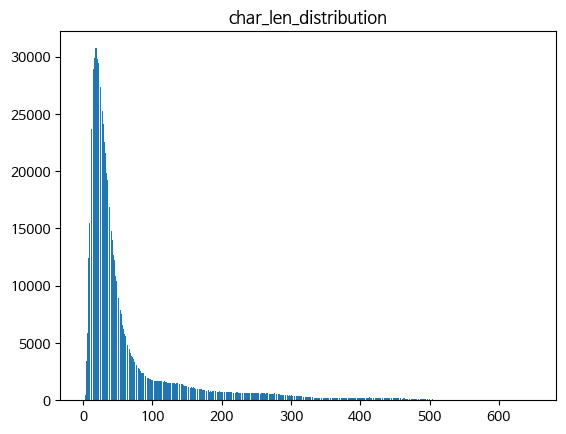

In [20]:
# train : dialect corpus by character
plot_seq_dist(df_train['dial'])

max_len : 1407
max_content : <cc> In the case of winter, you're gonna have to put something on the back of the table, and you're gonna have to put something on the back, and then you're gonna have to put something on the back of the table, and then you're gonna have to put something on the back of the table, and then you're gonna have to put something on the back, and then you're gonna have to put something on the back of the table, and then you're gonna have to put something on the back of the table, and then you're gonna have to put something on the floor, and then you're gonna have to put something on the floor, and then you're gonna have to put something on the floor, and then you're gonna have to do it. Have you thought about any other hobbies other than those? I want to learn yoga but theres no place to learn. I was a little busy during the semester so I couldnt do this until the last summer vacation I've been trying to read a lot of my own books, thinking that I'm going to have 

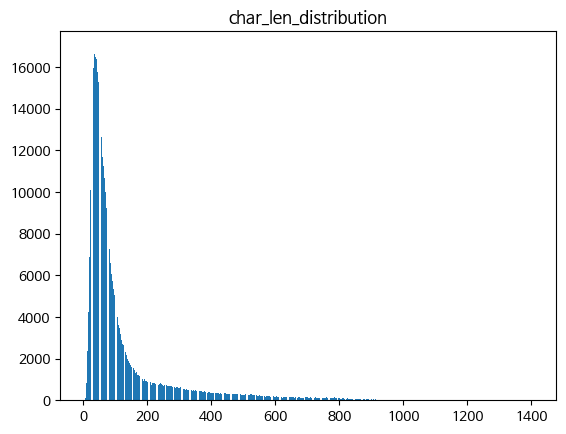

In [21]:
#english
plot_seq_dist(df_train['eng'])

In [22]:
df_train['c_len'] =df_train['dial'].apply(lambda x : len(x))

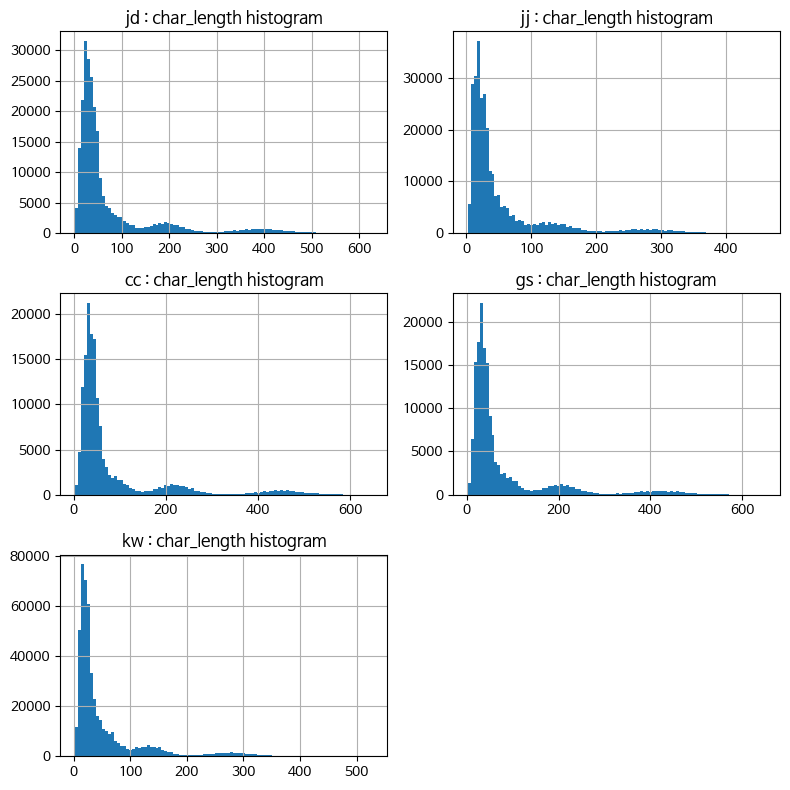

In [23]:
#by reg
plt.figure( figsize=(8,8))
for i, reg in enumerate(regs) :
    plt.subplot(3,2,i+1)
    ax = df_train.loc[df_train['reg'] == reg,'c_len'].hist(bins=100)
    plt.title(f'{reg} : char_length histogram')
plt.tight_layout()
plt.show()

max_len : 232
max_content : 올라갈 수 있도록 노력해 -봐야- 봐야 될 꺼 긋해 그자?  그서 막 순수한 느낌 이른 건 없었는데 미얀마 쫌 이케 터치가 들 됐느 느낌 사람들이?  그머 알았느 되느 기래이 알았제?  숙박이랑 막 고런 그느 아에 알았느 되거든예 정상 찍꼬 올래이 카머 인대이 아에 아침 일찍부터 가야 된대이 가주꼬  요번 초에 요번 연도 초에 갔대이 아가 일월에  회를 묵느 꺼를 추천한대이 그머 일단은 광안리를 쫌 추천을 카꼬 
min_len : 5
min_content : 그서 걍 
average_len : 66.2


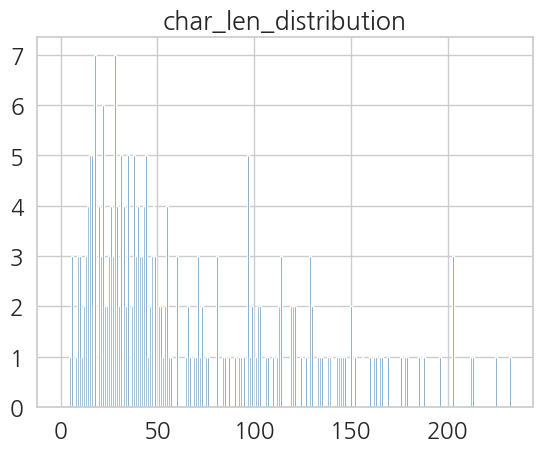

In [190]:
#test
plot_seq_dist(df_test['dial'])

max_len : 361
max_content : <cc> Imashing as Im still thinking that I wont fall Yes we came here and lost our wealth in many ways It's a fall, so if you had two billion dollars... So if you come to work on the weekend and eat and eat out what should you do Its just high in this house and have five or six machines in it. Daughter you just bought that like three hundred and five thousand.
min_len : 14
min_content : <kw> Try this.
average_len : 124.9


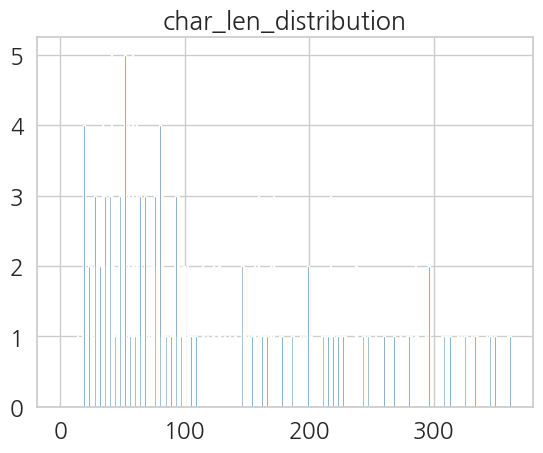

In [191]:
plot_seq_dist(df_test['eng'])

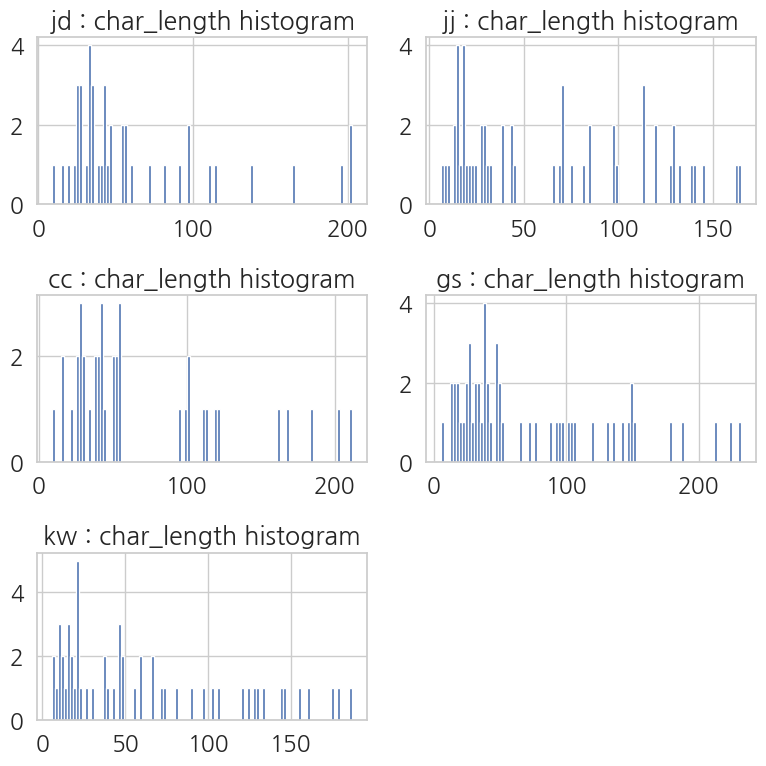

In [192]:
df_test['c_len'] =df_test['dial'].apply(lambda x : len(x))
#by reg
plt.figure( figsize=(8,8))
for i, reg in enumerate(regs) :
    plt.subplot(3,2,i+1)
    ax = df_test.loc[df_test['reg'] == reg,'c_len'].hist(bins=100)
    plt.title(f'{reg} : char_length histogram')
plt.tight_layout()
plt.show()

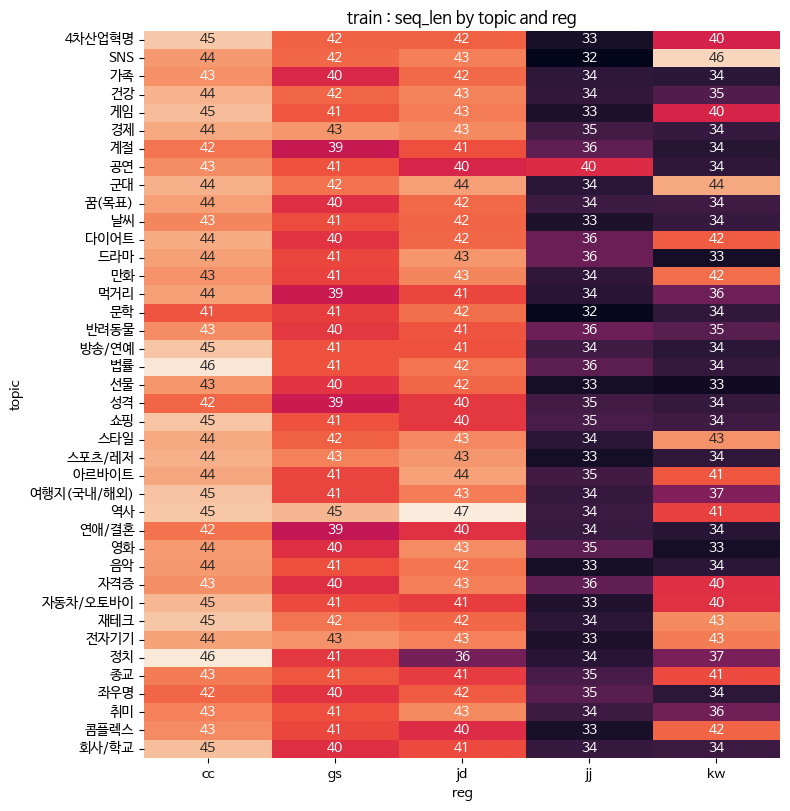

In [27]:
# reg, topic, tok_len 평균

import seaborn as sns
plt.figure(figsize=(8,8))
data = df_train.groupby(['topic','reg'])['tok_len'].mean().unstack()
sns.heatmap(data, annot=True,  cbar=False)
plt.tight_layout()
plt.title('train : seq_len by topic and reg')
plt.show()

## Tokenizer analysis

In [28]:
from wordcloud import WordCloud
import matplotlib as mpl
import matplotlib.font_manager as fm
from collections import Counter
import sentencepiece as spm

### import tokenizer 

In [29]:
data_path = os.getenv('HOME') +'/aiffel/saturi/notebook/Model'
spm_4000 = spm.SentencePieceProcessor()
spm_4000.Load(data_path + '/spm_dec_v.model')

data_path = os.getenv('HOME') +'/aiffel/saturi/notebook/Preprocessing'
msp_4000 = spm.SentencePieceProcessor()
msp_4000.Load(data_path + '/spm_dec_mecab_4009.model')

True

### tokenizer 별 사투리 특징 추출 여부 확인

In [48]:
colors = ['#0B1D77','#0045A5','#0A69C1','#198AC5','#27A9B5']

#### spm

100%|███████████████████████████████████████████████████████████████| 496436/496436 [00:28<00:00, 17590.04it/s]


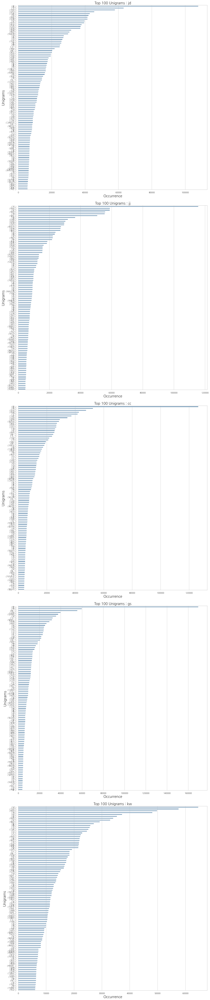

In [198]:
#by reg

fig = plt.figure(figsize=(15,70))

for i, reg in enumerate(regs) :
    
    frequency_pos = Counter()
    dial = df_train.loc[df_train['reg'] == reg,'dial'].values
    for k in tqdm.tqdm(dial) :
        tokenized = ''.join(spm_4000.encode_as_pieces(k)).replace('▁',' ').split()
        token_words = ngrams(tokenized,1)
        frequency_pos.update(token_words)

    df_pos = pd.DataFrame(frequency_pos.most_common(100))

    # Barplot that shows the top most common
    
    plt.subplot(5,1,i+1)
    sns.set(font_scale = 1.5, style = 'whitegrid', font ='NanumGothic')
    sns_pos_1 = sns.barplot(x = df_pos[1], y = df_pos[0], color = 'steelblue', width=0.4)

    # Setting axes labels
    sns_pos_1.set(xlabel = 'Occurrence', ylabel = 'Unigrams', title = f'Top 100 Unigrams : {reg}')
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)

    
plt.tight_layout()
plt.show()

100%|███████████████████████████████████████████████████████████████| 496436/496436 [00:30<00:00, 16545.04it/s]


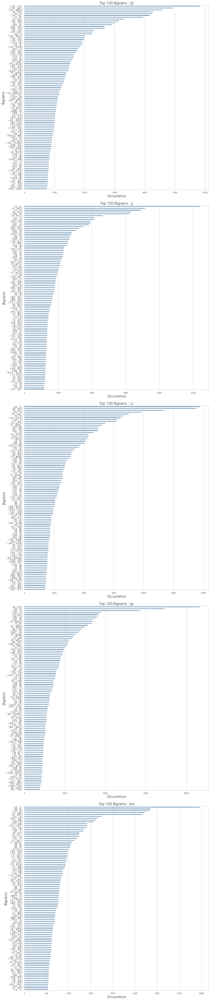

In [199]:
#by reg

fig = plt.figure(figsize=(15,70))

for i, reg in enumerate(regs) :
    
    frequency_pos = Counter()
    dial = df_train.loc[df_train['reg'] == reg,'dial'].values
    for k in tqdm.tqdm(dial) :
        tokenized = ''.join(spm_4000.encode_as_pieces(k)).replace('▁',' ').split()
        token_words = ngrams(tokenized,2)
        frequency_pos.update(token_words)

    df_pos = pd.DataFrame(frequency_pos.most_common(100))

    # Barplot that shows the top most common
    
    plt.subplot(5,1,i+1)
    sns.set(font_scale = 1.5, style = 'whitegrid', font ='NanumGothic')
    sns_pos_1 = sns.barplot(x = df_pos[1], y = df_pos[0], color = 'steelblue', width=0.4)

    # Setting axes labels
    sns_pos_1.set(xlabel = 'Occurrence', ylabel = 'Bigrams', title = f'Top 100 Bigrams : {reg}')
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)

    
plt.tight_layout()
plt.show()

100%|███████████████████████████████████████████████████████████████| 496436/496436 [00:34<00:00, 14323.41it/s]


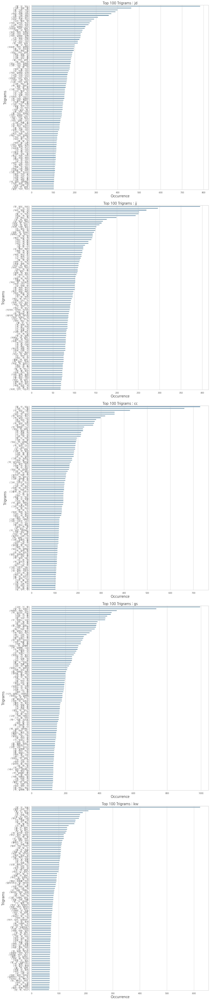

In [200]:
#by reg

fig = plt.figure(figsize=(15,70))

for i, reg in enumerate(regs) :
    
    frequency_pos = Counter()
    dial = df_train.loc[df_train['reg'] == reg,'dial'].values
    for k in tqdm.tqdm(dial) :
        tokenized = ''.join(spm_4000.encode_as_pieces(k)).replace('▁',' ').split()
        token_words = ngrams(tokenized,3)
        frequency_pos.update(token_words)

    df_pos = pd.DataFrame(frequency_pos.most_common(100))

    # Barplot that shows the top most common
    
    plt.subplot(5,1,i+1)
    sns.set(font_scale = 1.5, style = 'whitegrid', font ='NanumGothic')
    sns_pos_1 = sns.barplot(x = df_pos[1], y = df_pos[0], color = 'steelblue', width=0.4)

    # Setting axes labels
    sns_pos_1.set(xlabel = 'Occurrence', ylabel = 'Trigrams', title = f'Top 100 Trigrams : {reg}')
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)

    
plt.tight_layout()
plt.show()

#### msp

100%|███████████████████████████████████████████████████████████████| 496436/496436 [00:26<00:00, 18681.09it/s]


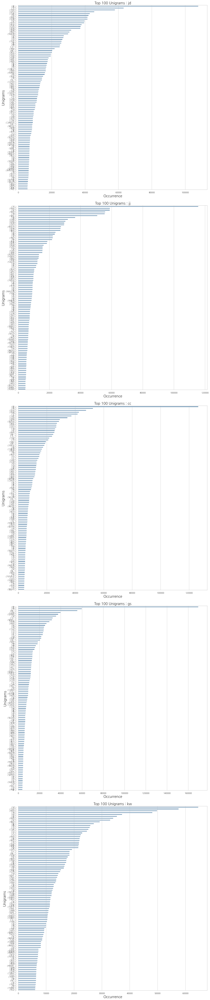

In [110]:
#by reg

fig = plt.figure(figsize=(15,70))

for i, reg in enumerate(regs) :
    
    frequency_pos = Counter()
    dial = df_train.loc[df_train['reg'] == reg,'dial'].values
    for k in tqdm.tqdm(dial) :
        tokenized = ''.join(msp_4000.encode_as_pieces(k)).replace('▁',' ').split()
        token_words = ngrams(tokenized,1)
        frequency_pos.update(token_words)

    df_pos = pd.DataFrame(frequency_pos.most_common(100))

    # Barplot that shows the top most common
    
    plt.subplot(5,1,i+1)
    sns.set(font_scale = 1.5, style = 'whitegrid', font ='NanumGothic')
    sns_pos_1 = sns.barplot(x = df_pos[1], y = df_pos[0], color = 'steelblue', width=0.4)

    # Setting axes labels
    sns_pos_1.set(xlabel = 'Occurrence', ylabel = 'Unigrams', title = f'Top 100 Unigrams : {reg}')
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)

    
plt.tight_layout()
plt.show()

100%|███████████████████████████████████████████████████████████████| 496436/496436 [00:30<00:00, 16303.58it/s]


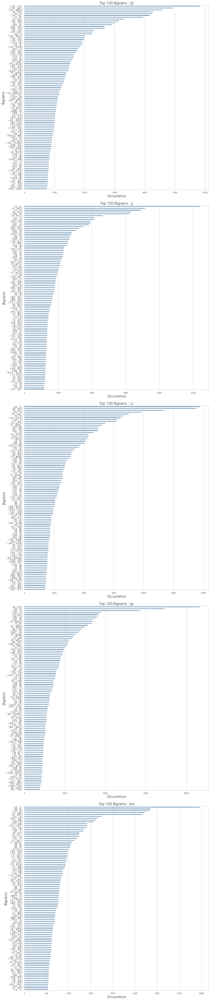

In [196]:
#by reg

fig = plt.figure(figsize=(15,70))

for i, reg in enumerate(regs) :
    
    frequency_pos = Counter()
    dial = df_train.loc[df_train['reg'] == reg,'dial'].values
    for k in tqdm.tqdm(dial) :
        tokenized = ''.join(msp_4000.encode_as_pieces(k)).replace('▁',' ').split()
        token_words = ngrams(tokenized,2)
        frequency_pos.update(token_words)

    df_pos = pd.DataFrame(frequency_pos.most_common(100))

    # Barplot that shows the top most common
    
    plt.subplot(5,1,i+1)
    sns.set(font_scale = 1.5, style = 'whitegrid', font ='NanumGothic')
    sns_pos_1 = sns.barplot(x = df_pos[1], y = df_pos[0], color = 'steelblue', width=0.4)

    # Setting axes labels
    sns_pos_1.set(xlabel = 'Occurrence', ylabel = 'Bigrams', title = f'Top 100 Bigrams : {reg}')
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)

    
plt.tight_layout()
plt.show()

100%|███████████████████████████████████████████████████████████████| 496436/496436 [00:29<00:00, 16587.15it/s]


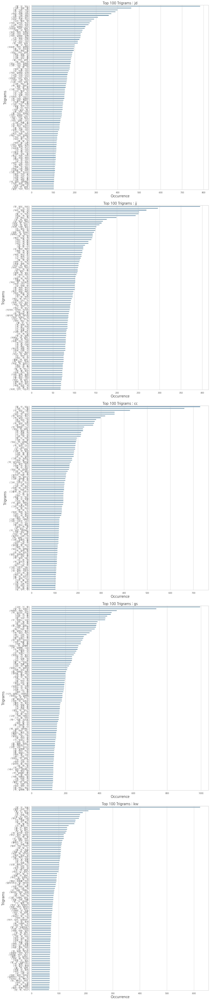

In [197]:
#by reg

fig = plt.figure(figsize=(15,70))

for i, reg in enumerate(regs) :
    
    frequency_pos = Counter()
    dial = df_train.loc[df_train['reg'] == reg,'dial'].values
    for k in tqdm.tqdm(dial) :
        tokenized = ''.join(msp_4000.encode_as_pieces(k)).replace('▁',' ').split()
        token_words = ngrams(tokenized,3)
        frequency_pos.update(token_words)

    df_pos = pd.DataFrame(frequency_pos.most_common(100))

    # Barplot that shows the top most common
    
    plt.subplot(5,1,i+1)
    sns.set(font_scale = 1.5, style = 'whitegrid', font ='NanumGothic')
    sns_pos_1 = sns.barplot(x = df_pos[1], y = df_pos[0], color = 'steelblue', width=0.4)

    # Setting axes labels
    sns_pos_1.set(xlabel = 'Occurrence', ylabel = 'Trigrams', title = f'Top 100 Trigrams : {reg}')
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)

    
plt.tight_layout()
plt.show()

### unk count
- oov 개수

In [221]:
test_set = set('b')

In [222]:
test_set |= set('a a a '.split())

In [223]:
test_set

{'a', 'b'}

In [224]:
split_token = set()
dial = df_train['dial'].values
for i in tqdm.tqdm(dial) :
    split_token |= set(i.split())

100%|████████████████████████████████████████████████████████████| 1340262/1340262 [00:06<00:00, 222439.08it/s]


In [232]:
print('split 기준 토크나이저를 사용하여 4000개 기준 vocab으로 하면 최소 oov 개수가 ', 4000 -  len(split_token)*-1,'임' )

split 기준 토크나이저를 사용하여 4000개 기준 vocab으로 하면 최소 oov 개수가  752112 임


In [234]:
tok_spm= []
tok_msp= []
dial = df_train['dial'].values
for i in tqdm.tqdm(dial) :
    tok_spm.extend(spm_4000.encode(i))
    tok_msp.extend(msp_4000.encode(i))
    

100%|██████████████████████████████████████████████████████████████| 1340262/1340262 [02:30<00:00, 8926.32it/s]


In [235]:
print('spm unk cnt : ', tok_spm.count(spm_4000.unk_id()))
print('msp unk cnt : ', tok_msp.count(msp_4000.unk_id()))

spm unk cnt :  525174
msp unk cnt :  50605


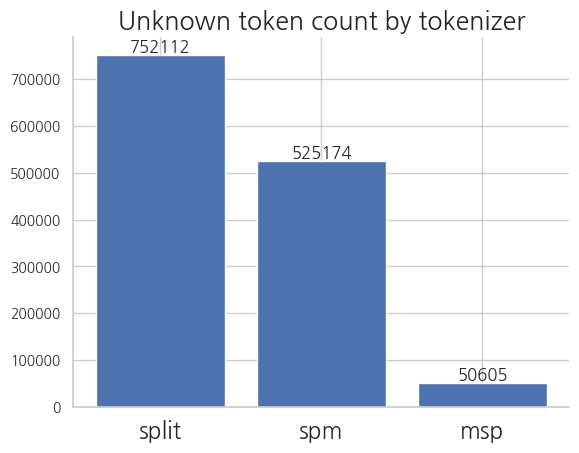

In [236]:
fig, ax = plt.subplots()
bar = ax.bar(x=['split','spm','msp'], height = [752112,tok_spm.count(spm_4000.unk_id()),tok_msp.count(spm_4000.unk_id())])
ax.bar_label(bar,fontsize=12)
sns.despine()
plt.title('Unknown token count by tokenizer')
plt.yticks(fontsize=10)
plt.show()

### subword fertility

- 토큰화된 단어마다 생성되는 부분단어의 평균 개수

In [111]:
tok_spm= []
tok_msp= []
dial = df_train['dial'].values
for i in tqdm.tqdm(dial) :
    #split by empty space
    tok_spm_len_split = len(i.split())
    
    #split by tokenzier
    tok_spm_len = len(spm_4000.encode(i))
    tok_msp_len = len(msp_4000.encode(i))
    
    # find percentage of subword split
    tok_spm.append(tok_spm_len / tok_spm_len_split )
    tok_msp.append(tok_msp_len / tok_spm_len_split)

100%|█████████████████████████████████████████████████████████████| 1340262/1340262 [02:13<00:00, 10049.20it/s]


In [115]:
print('spm subword fertility :',sum(tok_spm)/len(tok_spm))
print('msp subword fertility :',sum(tok_msp)/len(tok_msp))

spm subword fertility : 2.193813034295701
msp subword fertility : 2.312592527239291


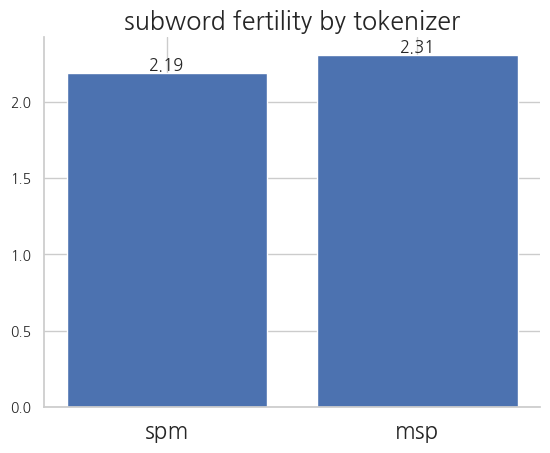

In [119]:
fig, ax = plt.subplots()
bar = ax.bar(x=['spm','msp'], height = [round(sum(tok_spm)/len(tok_spm),2),round(sum(tok_msp)/len(tok_msp),2)])
ax.bar_label(bar,fontsize=12)
sns.despine()
plt.title('subword fertility by tokenizer')
plt.yticks(fontsize=10)
plt.show()

### proportion of continued words 
- 말뭉치에서 적어두 두 개의 부분 토큰으로 분활된 토큰화된 단어의 비율

In [284]:
tok_spm= []
tok_msp= []
tok_split = []
dial = df_train['dial'].values
for i in tqdm.tqdm(dial) :
    total_cnt = 0
    spm_temp = 0
    msp_temp = 0
    for k in i.split() :
        if k == ' ' or k ==  '\u200b' or k =='\x9f':
            continue
        total_cnt += 1
        word_spm = spm_4000.encode_as_pieces(k)
        word_msp = msp_4000.encode_as_pieces(k)
        
        if word_spm[0] == '▁' :
            word_spm.remove('▁')
            
        if word_msp[0] == '▁' :
            word_msp.remove('▁')
            
        if len(word_spm) > 1 : spm_temp+=1
        if len(word_msp) > 1 : msp_temp+=1
                        
    tok_spm.append(spm_temp)
    tok_msp.append(msp_temp)
    tok_split.append(total_cnt)

100%|██████████████████████████████████████████████████████████████| 1340262/1340262 [04:09<00:00, 5373.91it/s]


In [286]:
print('spm proportion of continued words :',sum(tok_spm)/sum(tok_split) * 100)
print('msp proportion of continued words :',sum(tok_msp)/sum(tok_split) * 100)

spm proportion of continued words : 55.13527722500944
msp proportion of continued words : 67.53569775943595


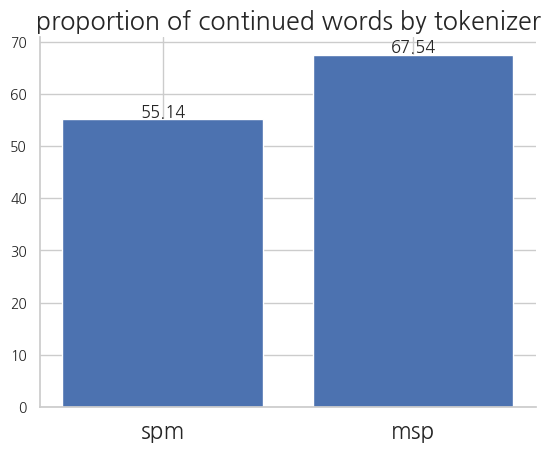

In [287]:
fig, ax = plt.subplots()
bar = ax.bar(x=['spm','msp'], height = [round(sum(tok_spm)/sum(tok_split) * 100,2),round(sum(tok_msp)/sum(tok_split) * 100,2)])
ax.bar_label(bar,fontsize=12)
sns.despine()
plt.title('proportion of continued words by tokenizer')
plt.yticks(fontsize=10)
plt.show()

## Model Results

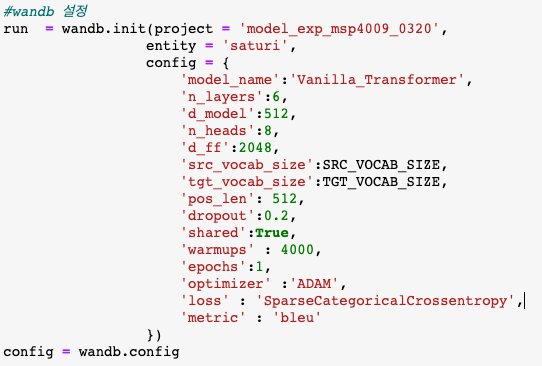

SRC_VOCAB_SIZE : 4009
TGT_VOCAB_SIZE : 4009

### spm 4000 training results
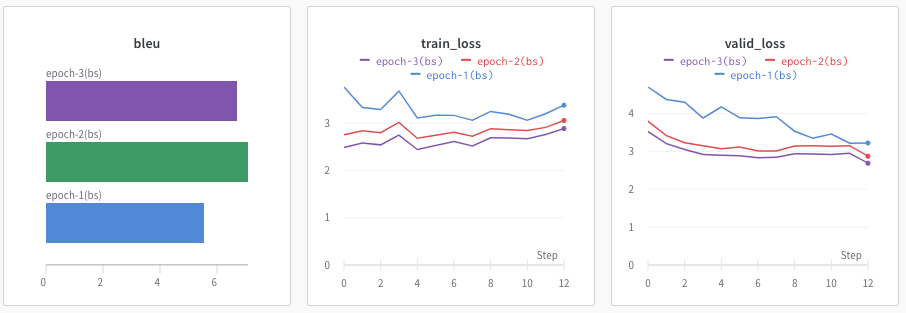

### msp 4000 training results
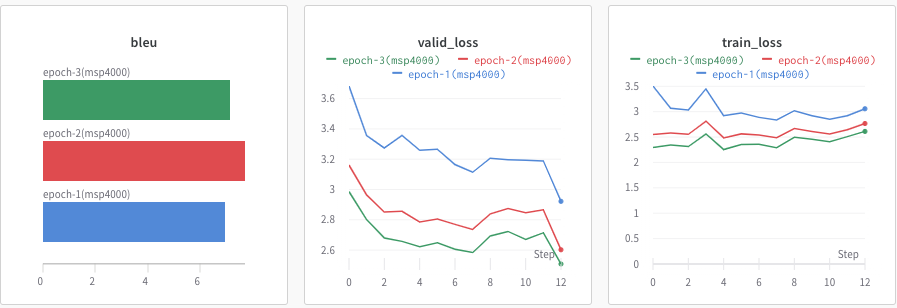

In [122]:
data_path = os.getenv('HOME') + '/aiffel/DATA'
spm_df = pd.read_csv(data_path + '/test_results_spm4000.csv', index_col='Unnamed: 0')
msp_df = pd.read_csv(data_path + '/test_results_msp4000.csv', index_col='Unnamed: 0')
a_df = pd.merge(spm_df, msp_df.loc[:,['bleu','pred']], left_index=True, right_index=True)
a_df.rename(columns={'bleu_x':'bleu_spm','bleu_y':'bleu_msp','pred_x':'pred_spm','pred_y':'pred_msp'}, inplace=True)

['corpus_dec_8009.txt',
 'data_train_spm_4000_0317.pkl',
 'corpus_enc_8009.txt',
 'test_results_spm4000.csv',
 'test_v_final_0313.csv',
 'train_v_final_0317.csv',
 'corpus_dec_r0.txt',
 '.ipynb_checkpoints',
 'data_test_msp_4000_0320.pkl',
 'data_test_spm_4000_0317.pkl',
 'data_test_spm_4000.pkl',
 'data_train_spm_4000.pkl',
 'corpus_enc_r0.txt',
 'data_train_msp_4000_0320.pkl',
 'train_v_final_0313.csv',
 'test_results_msp4000.csv',
 'test_v_final_0317.csv',
 'corpus_dec_mecab_4009.txt']

In [152]:
# bleu by reg
a_df.groupby(['reg'])[['bleu_spm','bleu_msp']].agg(['mean', 'max']).round(2)

bleu_spm        bleu_msp       
        mean    max     mean    max
reg                                
cc      7.39  33.27     7.99  42.46
gs      6.78  30.74     7.95  25.41
jd      4.72  16.34     6.69  27.30
jj      7.21  31.95     7.05  33.98
kw      7.20  50.00     6.18  31.95

In [160]:
a_df.loc[a_df['reg'] == 'cc', ['eng','dial','pred_spm','bleu_spm','pred_msp','bleu_msp']].sort_values(by='bleu_spm').head()

,eng,dial,pred_spm,bleu_spm,pred_msp,bleu_msp
1362,<kw> Maybe they're just left out somewhere in ...,잘뭇허먼 컴 어인가에 거냥 방치돼서요.,앗사리 ⁇ 이 ⁇ ⁇ 이 ⁇,0.0,그~ 컴활이나 뭐~ 컴백하고 뭐,0.000000
866,<cc> I wot out a heated scab so I threw it out...,열 불 딱지가 나가 내는 거여 개코 가가주구 검거지 구 찝어 던졌다니께 고기덩어리를...,⁇ 아 ⁇ ⁇ 아 ⁇ ⁇ 아 ⁇ ⁇ 아 ⁇ ⁇ 아 ⁇ ⁇ 아,0.0,그~ ⁇ 케 ⁇ 는디 그~ ⁇ 케 ⁇ 어 가주구 떤져 놨는,0.000000
1188,<gs> My country is a country that looks like i...,우리나래이 랑 우리나래이 먼가 대께 될 꺼 겉은 나란데,뭐 ⁇ ⁇ 일 ⁇ 일상 나라를 볼라꼬 나라를 ⁇,0.0,우리나라가 일하느 모습이라꼬 생각하꼬 가느 기,0.000000
223,"<jd> So he's an animal, so he's not -- he's no...",긍게 그~ 동물이라고 이르케 쩌그 아-는- 허는 게잉 아니여.,동물농장도 있고이 긍께 동물도 안 ⁇ 아 ⁇ 안 ⁇ 아 ⁇,0.0,고 동물을 긍게 고 사람은 또잉 안 그또 동물이라서 또잉 고 반,8.913766
411,<jj> After all I told you Dad understands But ...,결국엔 말핸? 아방도 이해는 되는거라 근디 아방도 날 이해해줘야 되부는 거네.,이해했댄 이해했댄 이해했댄 이해했댄 이해했댄 아방이,0.0,아이 니 말 다이 좋아해신디 아방안티 이해해줘야 되는,7.433762


In [159]:
a_df.loc[a_df['reg'] == 'cc', ['eng','dial','pred_spm','bleu_spm','pred_msp','bleu_msp']].sort_values(by='bleu_spm').tail()

,eng,dial,pred_spm,bleu_spm,pred_msp,bleu_msp
756,<cc> My groom is small too so the kids are small,내도 짝구 울 신랑도 짝구 긍까 애덜이 짝아가주구 긍까,내도 짝게 혀 가주구 신랑도 짝아 짝아 짝,14.575161,내도 울 신랑도 짝구 긍까 울 아들도 짝구,42.456726
762,<cc> Its a big problem because I havent seen i...,요즘이 몬 봐가지구 큰일이야.,아이폰이 알은 좋아가꼬 요시 큰일 났슈.,16.149931,내는 요새는 쫌 알은 보러 그양 아이폰을,0.000000
791,<cc> That's right. I'm his delivery.,그려 가주구 나가 그~ 배달,그 ⁇ ⁇ 배 ⁇ 배달 ⁇ 배,16.515822,그~ -하- -하- -하-,27.821195
806,<cc> I feel much more stable than other friends,지는 따른 구 친구보다는 쉬끼 안정감이 느껴지구,따른 친구보다는 쫌 안정적이구 안정,19.153996,따른 친구들보다 쫌 드 안정적,16.106527
860,<cc> I'm a little curious about that.,게 쫌 궁금혀.,그른 꺼 쫌 궁금혀. 그른 꺼이,33.265097,그른 꺼이 대해서 쫌 마이 궁금하기도,19.304870


In [149]:
# bleu by tok_cat
a_df.groupby(['tok_cat'])[['bleu_spm','bleu_msp']].agg(['mean', 'max']).round(2)

bleu_spm        bleu_msp       
            mean    max     mean    max
tok_cat                                
1           9.02  50.00     8.84  42.46
2           5.09  10.60     6.33  13.38
3           4.47   6.96     5.20   9.67
4           3.00   5.18     4.41  11.81
5           2.25   5.67     3.73   6.04

In [168]:
a_df.loc[a_df['tok_cat'] == 1, ['eng','dial','pred_spm','bleu_spm','pred_msp','bleu_msp']].sort_values(by='bleu_spm').tail()

,eng,dial,pred_spm,bleu_spm,pred_msp,bleu_msp
526,<jj> Isnt there kimchi right?,짐치 어떵들 이?,거기? 거기.,31.947155,나옵서 거 거 거 거,0.000000
482,<jj> With that week,거 거 주술 생각이랑마랑,거 ⁇ 그 ⁇,31.947155,거 거 거 거 거,33.980885
860,<cc> I'm a little curious about that.,게 쫌 궁금혀.,그른 꺼 쫌 궁금혀. 그른 꺼이,33.265097,그른 꺼이 대해서 쫌 마이 궁금하기도,19.304870
1273,<kw> Did you eat honey?,꿀 뭇나?,꿀두 먹나 꿀,48.549177,내 니한테 진지 먹었,0.000000
1416,<kw> Try this.,이그 쫌 먹어봐.,이그 함 먹어봐.,50.000000,이그 먹어보,26.013005


In [167]:
a_df.loc[a_df['tok_cat'] == 4, ['eng','dial','pred_spm','bleu_spm','pred_msp','bleu_msp']].sort_values(by='bleu_msp').tail()

,eng,dial,pred_spm,bleu_spm,pred_msp,bleu_msp
1380,<kw> Your mother-in-law would be worried if yo...,쇠주 마시구 드가면 장인으런 장모님이 극정하실 거예요. 병신같은 간나 해필이면 남...,꺽정 꺽정 변호새가 들어가셨다면서요. 요년이 만나믄 요 년을 만내러 다신 만내는 ...,2.908498,어멍이가 들어가지고 술이 처먹으러 들어가시면 어멍이가 걱정했을 틴데. 요 예잔 사램...,5.223334
389,<jj> And in the meantime I have the money I sa...,겡 거 와중에이 나옵서 모은 돈도 있고이 해질거 아니라예 거 가졍 호꼼 호솔 구져...,거 돈들 모욕도 거 돈들 모아그냉 거 아이패드도 ⁇ 아 ⁇ 아이 ⁇ 아 ⁇ ...,4.212933,거 와중에이 거 와중에이 돈이 이서야 되고이 아이 허는 게 아이 좋아해마씨 근디 호...,6.524816
902,<gs> Its so scary if you get caught its just a...,느무 무섭대이 고고느 걸려버리머 걍 또 또 그치 친구랑 함께 보꼬 또 다른 사람과...,걸리머 걸리느 기래이 걍 다른 친구랑 그치 영화로 핸 분 보느 기 있으믄은 걍 영...,4.372154,걸리머 걍 걸리머 또 무섭은 거래이 뭐~ 다른 친구랑 그치 보믄은 또 영화관에서 카...,7.238724
1120,<gs> I like to twist alone. I have to show my ...,혼차 꼼시락 꼼시락 대느 꺼를 쫌 좋아하느 편입니대이. 여름엔 또 몸 보이나 주야...,⁇ 아 ⁇ ⁇ 아 ⁇ ⁇ 아 ⁇ ⁇ 아 ⁇ ⁇ 아 ⁇ ⁇ 아 ⁇...,2.188673,내나 혼차 꼬 몸을 좋아해가 꼬 혼차 꼬 몸을 보여줘야 되가 여름에느 쫌 자극적으로...,7.622950
304,<jj> Be careful it could be like an expert or ...,조심해당 어디게 거 노전도사님 노전도사님 닮은 꼴이 되실 수도 인. 말댄 또이 ...,전문가도 조심해사 되고이 또이 아이 허는 게 또이 아이 해부난 또이 아이 허는 ...,2.517230,전문가 닮은 게 조심해도 되실 수도 있고이. 또이 안되는디 나맨 궁금한 게 이시민 ...,11.809794


In [147]:
# bleu by topic
a_df.groupby(['topic'])[['bleu_spm','bleu_msp']].agg(['mean', 'max']).round(2)

bleu_spm        bleu_msp       
               mean    max     mean    max
topic                                     
4차산업혁명         0.00   0.00     1.97   3.93
SNS           17.04  24.03     1.42   4.25
가족             6.85  50.00     6.91  31.95
건강             8.53  24.93     8.69  24.03
게임             7.09   8.51     5.96   6.04
경제            22.14  30.74    17.74  27.82
계절             8.86  19.67     7.90   9.57
공연             4.48  14.50     8.45  13.56
군대             8.95  10.38    12.25  13.38
꿈(목표)          5.41  12.26     3.66   7.96
날씨             4.40   4.40     4.17   4.17
다이어트           6.11  19.15     8.10  16.11
드라마            9.42  48.55     5.86  31.95
만화             6.57  16.25     8.08  11.05
먹거리            3.87  10.02     5.19  19.80
문학             7.20  19.07     7.63  19.64
반려동물           2.40   7.33     3.63  10.79
방송/연예         12.51  16.15     2.11   8.42
법률             3.89   3.89     6.42   6.42
선물            11.89  14.00     5.12  10.23
성격             2.22   7.03     5.26  16.52
쇼핑             7.59  19.67     6.51  22.84
스타일            9.04  16.52     8.56  18.28
스포츠/레저        10.65  16.15     5.19  10.63
아르바이트          3.58   6.79     9.21  14.49
여행지(국내/해외)     5.31  19.21     7.79  24.88
역사             6.98  31.95     5.81  24.03
연애/결혼          6.55  19.30    12.22  42.46
영화             5.41  14.49     5.95  14.00
음악             6.52  11.06     6.83   9.03
자격증           10.93  33.27     8.81  19.30
자동차/오토바이      10.19  31.95    15.47  33.98
재테크            2.36   5.06     3.59   4.71
전자기기           4.21   4.21     6.52   6.52
정치             2.74   5.49    11.54  14.88
종교             5.75  10.86     8.76  12.86
좌우명            1.37   5.49     4.03   8.36
취미             4.85   9.79     7.89  19.30
콤플렉스          10.15  16.34    10.35  16.34
회사/학교          5.39  12.19     6.48  13.15